# **1. Import Dependencies**

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from scipy.sparse.csgraph import dijkstra
import networkx as nx

In [ ]:
from matplotlib.collections import LineCollection

# **2. Testing Grounds**

In [ ]:
CANVAS_SIZE = 1000
NUM_STATIONS = 10
ISLAND_PENALTY = 4000

In [ ]:
CANVAS = tf.fill((CANVAS_SIZE, CANVAS_SIZE), 0).numpy()

In [ ]:
STATION_IDXS = tf.random.uniform(
    shape=(NUM_STATIONS, 2),
    minval=0,
    maxval=CANVAS_SIZE-1,
    dtype=tf.int32
).numpy()

STATION_IDXS

array([[872, 757],
       [279, 718],
       [984, 877],
       [488, 549],
       [159,  98],
       [ 85, 749],
       [319, 356],
       [ 77, 288],
       [831, 410],
       [105, 980]], dtype=int32)

In [ ]:
STATION_SIZES = tf.random.normal(
    shape=(NUM_STATIONS,),
    mean=400.0,
    stddev=200.0,
    dtype=tf.float32
).numpy()

STATION_SIZES

array([  53.34073 ,  169.97337 ,  380.3571  ,  306.2298  ,  118.56848 ,
       1052.9133  ,  213.61923 ,  333.9966  ,  695.2699  ,   35.454712],
      dtype=float32)

In [ ]:
DEMAND = tf.random.uniform(
    shape=(NUM_STATIONS, NUM_STATIONS),
    minval=0,
    maxval=1
).numpy()

for col in range(NUM_STATIONS):
  colSum = np.sum(DEMAND[:, col])
  for row in range(NUM_STATIONS):
    DEMAND[row, col] = DEMAND[row, col] / colSum

DEMAND

array([[0.00090053, 0.16814497, 0.04522708, 0.08036122, 0.00288807,
        0.1170795 , 0.03681806, 0.12974598, 0.03163065, 0.01351107],
       [0.04075171, 0.07975133, 0.1580495 , 0.12976468, 0.18851386,
        0.11303186, 0.13326822, 0.07163942, 0.12601405, 0.13422127],
       [0.11317685, 0.0997511 , 0.05329149, 0.17490983, 0.16602199,
        0.10065655, 0.07657731, 0.17400524, 0.09731509, 0.09212362],
       [0.11058757, 0.02889375, 0.12086533, 0.13159546, 0.19746967,
        0.14836657, 0.17529564, 0.01796835, 0.1731195 , 0.11792707],
       [0.16547218, 0.09154452, 0.095112  , 0.02824478, 0.00498112,
        0.07483712, 0.22078942, 0.04991121, 0.17575932, 0.10305624],
       [0.05518761, 0.1159426 , 0.12458173, 0.02265726, 0.01306062,
        0.07065522, 0.10056902, 0.00053034, 0.03372075, 0.12862955],
       [0.1469046 , 0.00266788, 0.08550065, 0.10065517, 0.25180906,
        0.09779228, 0.01957653, 0.1731791 , 0.17910908, 0.09045786],
       [0.10985219, 0.15790066, 0.1018254

In [ ]:
TRIPS = np.array([[int(round(STATION_SIZES[start] * DEMAND[end, start])) for start in range(NUM_STATIONS)] for end in range(NUM_STATIONS)])

TRIPS

array([[  0,  29,  17,  25,   0, 123,   8,  43,  22,   0],
       [  2,  14,  60,  40,  22, 119,  28,  24,  88,   5],
       [  6,  17,  20,  54,  20, 106,  16,  58,  68,   3],
       [  6,   5,  46,  40,  23, 156,  37,   6, 120,   4],
       [  9,  16,  36,   9,   1,  79,  47,  17, 122,   4],
       [  3,  20,  47,   7,   2,  74,  21,   0,  23,   5],
       [  8,   0,  33,  31,  30, 103,   4,  58, 125,   3],
       [  6,  27,  39,  57,   7, 173,  47,   5,   3,   4],
       [  6,  26,  37,  31,  10, 117,   2,  59,  91,   4],
       [  8,  17,  45,  14,   5,   2,   1,  64,  34,   3]])

In [ ]:
FLOW = np.zeros((NUM_STATIONS, NUM_STATIONS), dtype=np.int32)

FLOW = TRIPS + TRIPS.T

for i in range(NUM_STATIONS):
  FLOW[i, i] = 0

FLOW

array([[  0,  31,  23,  31,   9, 126,  16,  49,  28,   8],
       [ 31,   0,  77,  45,  38, 139,  28,  51, 114,  22],
       [ 23,  77,   0, 100,  56, 153,  49,  97, 105,  48],
       [ 31,  45, 100,   0,  32, 163,  68,  63, 151,  18],
       [  9,  38,  56,  32,   0,  81,  77,  24, 132,   9],
       [126, 139, 153, 163,  81,   0, 124, 173, 140,   7],
       [ 16,  28,  49,  68,  77, 124,   0, 105, 127,   4],
       [ 49,  51,  97,  63,  24, 173, 105,   0,  62,  68],
       [ 28, 114, 105, 151, 132, 140, 127,  62,   0,  38],
       [  8,  22,  48,  18,   9,   7,   4,  68,  38,   0]])

In [ ]:
DISTANCES = np.zeros((NUM_STATIONS, NUM_STATIONS))

for i in range(NUM_STATIONS):
  for j in range(NUM_STATIONS):
    DISTANCES[i,j] = np.linalg.norm(STATION_IDXS[i]-STATION_IDXS[j])

DISTANCES

array([[   0.        ,  594.28107828,  164.14627623,  436.71501005,
         970.9016428 ,  787.04065969,  683.08857405,  923.03087706,
         349.4137948 ,  798.76028945],
       [ 594.28107828,    0.        ,  722.70740968,  268.7787194 ,
         631.50613615,  196.4611921 ,  364.20323996,  475.08315062,
         632.11391378,  314.51550041],
       [ 164.14627623,  722.70740968,    0.        ,  594.64274989,
        1134.6655895 ,  908.06662751,  844.78754726, 1081.4665968 ,
         491.42446012,  885.01412418],
       [ 436.71501005,  268.7787194 ,  594.64274989,    0.        ,
         558.24904836,  449.89887753,  256.53459806,  486.8695924 ,
         370.09458251,  576.58477261],
       [ 970.9016428 ,  631.50613615, 1134.6655895 ,  558.24904836,
           0.        ,  655.19233817,  303.58524338,  206.93960472,
         740.89675394,  883.65151502],
       [ 787.04065969,  196.4611921 ,  908.06662751,  449.89887753,
         655.19233817,    0.        ,  457.38933088,  461

In [ ]:
FULL_TRACK = 0
for i in range(NUM_STATIONS):
  for j in range(i, NUM_STATIONS):
    FULL_TRACK += DISTANCES[i,j]

FULL_TRACK

26516.333258616454

In [ ]:
"""LINES = np.round(0.7 * np.random.rand(NUM_STATIONS, NUM_STATIONS))

LINES"""

'LINES = np.round(0.7 * np.random.rand(NUM_STATIONS, NUM_STATIONS))\n\nLINES'

In [ ]:
LINES = np.ones((NUM_STATIONS, NUM_STATIONS))

LINES

array([[1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.]])

In [ ]:
def plot_system(CANVAS, LINES):
  # Draw canvas
  plt.imshow(CANVAS, cmap='Greys')

  # Draw flow/demand between stations
  demand_lines = []
  for i in range(NUM_STATIONS):
      for j in range(i + 1, NUM_STATIONS):
          demand_lines.append([(STATION_IDXS[i, 0], STATION_IDXS[i, 1]), (STATION_IDXS[j, 0], STATION_IDXS[j, 1])])
  lc_stations = LineCollection(demand_lines, alpha=0.75, linestyle='-', linewidths=TRIPS.flatten()/20)
  plt.gca().add_collection(lc_stations)

  # Draw metro lines between stations
  station_lines = []
  for i in range(NUM_STATIONS):
      for j in range(NUM_STATIONS):
          if LINES[i,j] == 1.0:
              station_lines.append([(STATION_IDXS[i, 0], STATION_IDXS[i, 1]), (STATION_IDXS[j, 0], STATION_IDXS[j, 1])])
  lc_stations = LineCollection(station_lines, alpha=1, color='black', linestyle='-', linewidths=1.5)
  plt.gca().add_collection(lc_stations)

  # Draw stations
  plt.scatter(STATION_IDXS[:,0], STATION_IDXS[:,1], s=STATION_SIZES, zorder=4)

  # Add station indices
  for i, (x, y, size) in enumerate(zip(STATION_IDXS[:, 0], STATION_IDXS[:, 1], STATION_SIZES)):
      fontsize = max(size**.8 * 0.1, 8)
      plt.annotate(str(i), (x, y), ha='center', va='center', size=fontsize, color='white', fontweight='bold', zorder=5)

  # Labels
  plt.title('MAP OF AREA')
  plt.xlabel('West/East')
  plt.ylabel('South/North')

  plt.show()

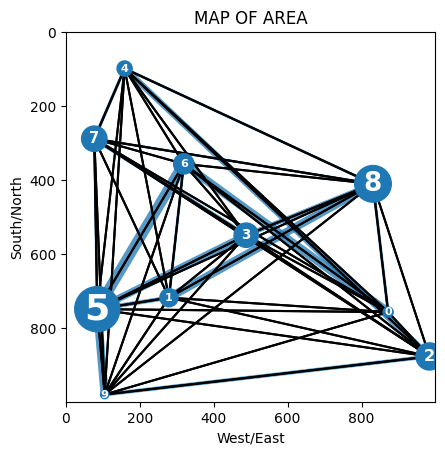

In [ ]:
plot_system(CANVAS, LINES)

In [ ]:
def find_shortest_path(adjacency_matrix, weight_matrix, source_node, target_node):
    try:
        # Create a directed graph from the matrices
        G = nx.from_numpy_array(adjacency_matrix, create_using=nx.DiGraph)

        # Add weights to the edges
        for i in range(G.number_of_nodes()):
            for j in range(G.number_of_nodes()):
                if G.has_edge(i, j):
                    G[i][j]['weight'] = weight_matrix[i, j]

        # Find the shortest path from source to target
        shortest_path = nx.shortest_path(G, source=source_node, target=target_node, weight='weight')

        # Calculate the sum of edge weights on the shortest path
        total_weight = sum(G[shortest_path[i]][shortest_path[i + 1]]['weight'] for i in range(len(shortest_path) - 1))

        return shortest_path, total_weight

    except nx.NetworkXNoPath:
        # Return -1 when there is no path between the nodes
        return -1, -1

In [ ]:
def get_min_dist(LINES, DISTANCES):
  MIN_DIST = np.zeros((NUM_STATIONS, NUM_STATIONS))

  for i in range(NUM_STATIONS):
    for j in range(NUM_STATIONS):
      shortest_path, total_weight = find_shortest_path(LINES, DISTANCES, i, j)
      MIN_DIST[i,j] = total_weight

  return MIN_DIST

In [ ]:
MIN_DIST = get_min_dist(LINES, DISTANCES)

MIN_DIST

array([[   0.        ,  594.28107828,  164.14627623,  436.71501005,
         970.9016428 ,  787.04065969,  683.08857405,  923.03087706,
         349.4137948 ,  798.76028945],
       [ 594.28107828,    0.        ,  722.70740968,  268.7787194 ,
         631.50613615,  196.4611921 ,  364.20323996,  475.08315062,
         632.11391378,  314.51550041],
       [ 164.14627623,  722.70740968,    0.        ,  594.64274989,
        1134.6655895 ,  908.06662751,  844.78754726, 1081.4665968 ,
         491.42446012,  885.01412418],
       [ 436.71501005,  268.7787194 ,  594.64274989,    0.        ,
         558.24904836,  449.89887753,  256.53459806,  486.8695924 ,
         370.09458251,  576.58477261],
       [ 970.9016428 ,  631.50613615, 1134.6655895 ,  558.24904836,
           0.        ,  655.19233817,  303.58524338,  206.93960472,
         740.89675394,  883.65151502],
       [ 787.04065969,  196.4611921 ,  908.06662751,  449.89887753,
         655.19233817,    0.        ,  457.38933088,  461

In [ ]:
def get_flow_score(LINES, DISTANCES):
  MIN_DIST = np.zeros((NUM_STATIONS, NUM_STATIONS))
  for i in range(NUM_STATIONS):
    for j in range(NUM_STATIONS):
      shortest_path, total_weight = find_shortest_path(LINES, DISTANCES, i, j)
      MIN_DIST[i,j] = total_weight

  total_dist = 0
  for i in range(NUM_STATIONS):
    for j in range(NUM_STATIONS):
      if MIN_DIST[i,j] != -1.0:
        total_dist += MIN_DIST[i,j] * TRIPS[i,j]
      else:
        total_dist += ISLAND_PENALTY * TRIPS[i,j]

  return total_dist / np.sum(TRIPS)

In [ ]:
F = get_flow_score(LINES, DISTANCES)

F

541.580745334333

In [ ]:
BEST_SCORE = F

# **3. Evolution**

In [ ]:
CANVAS_SIZE = 1000
NUM_STATIONS = 10
ISLAND_PENALTY = 5000
TRACK_LIMIT = 4000

NUM_GENERATIONS = 100
POP_SIZE = 100
CROSSOVER_RATE = 0.1
MUTATION_RATE = 0.01

PARENT_SHARE = 0.4
MUTATED_SHARE = 0.4
ELITE_SHARE = 0.2

NUM_PARENTS = int(PARENT_SHARE * POP_SIZE)
NUM_MUTANTS = int(MUTATED_SHARE * POP_SIZE)
NUM_ELITES = int(ELITE_SHARE * POP_SIZE)

In [ ]:
LINES_POP = np.round(0.6 * np.random.rand(POP_SIZE, NUM_STATIONS, NUM_STATIONS))

In [ ]:
LINES_POP[0]

array([[0., 1., 1., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
       [1., 0., 0., 0., 0., 0., 0., 0., 0., 1.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [1., 0., 0., 0., 1., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 1., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
       [0., 0., 1., 0., 1., 0., 0., 0., 0., 0.],
       [0., 1., 0., 1., 0., 1., 0., 0., 1., 0.]])

In [ ]:
# check avg track length
track_lens = np.zeros((POP_SIZE))
for pop in range(POP_SIZE):
  track_len = 0
  track = LINES_POP[pop] * DISTANCES
  for i in range(NUM_STATIONS):
    for j in range(i+1, NUM_STATIONS):
      if track[i,j] > 0 or track[j,i] > 0:
        track_len += DISTANCES[i,j]
  track_lens[pop] = track_len

avg_len = np.sum(track_lens) / POP_SIZE

avg_len

8010.398681868533

In [ ]:
# shorten lines if too much track is used
tasks = np.ones((POP_SIZE))
while np.sum(tasks) != 0:
  for pop in range(POP_SIZE):
    track_len = 0
    track = LINES_POP[pop] * DISTANCES
    for i in range(NUM_STATIONS):
      for j in range(i+1, NUM_STATIONS):
        if track[i,j] > 0 or track[j,i] > 0:
          track_len += DISTANCES[i,j]
    if track_len > TRACK_LIMIT:
      LINES_POP[pop] = np.round(0.6 * np.random.rand(NUM_STATIONS, NUM_STATIONS))
    else:
      tasks[pop] = 0

In [ ]:
# make sure all lines are within the track limit after shortening
for pop in range(POP_SIZE):
    track_len = 0
    track = LINES_POP[pop] * DISTANCES
    for i in range(NUM_STATIONS):
      for j in range(i+1, NUM_STATIONS):
        if track[i,j] > 0 or track[j,i] > 0:
          track_len += DISTANCES[i,j]
    print(track_len)

2815.9679495150167
3562.0289349401473
3054.2134605476704
3904.4154205858954
3518.743762436369
3635.2306401168153
2319.774499094548
3971.749252250782
3300.5749391211452
2540.32358059127
2616.825995835938
3386.157812625623
3519.267338714043
3698.2133352648234
3897.931042840548
3512.9813865348415
3969.5656763543575
3958.8700117023395
3076.3080118007438
3263.188660140928
3954.045482833719
3451.87094415026
3557.080784354696
3640.1304077510185
3366.616854590356
3671.9663554186113
3486.6870936972045
3926.4005476099796
3758.115486057408
3806.8928740329266
3200.058454284067
3614.0426311123038
3010.812797594912
3690.510170042189
3890.962368236723
3717.9441129722045
3933.9609116795204
3427.964039896257
3184.77772733561
3515.685416083976
3770.7016069918086
3194.0174916883966
3725.260434572708
3164.806279704087
2921.403775550036
3725.0260803412893
2243.16676535864
2768.2628735005283
3112.9679641071775
3451.45683534772
2855.453978104179
3157.5458530855153
3742.9971734080286
2987.236684856211
3437.33

In [ ]:
def evaluate(LINES_POP):
    LINES_SCORES = np.zeros((POP_SIZE))
    best_track_len = float('inf')

    for pop in range(POP_SIZE):
      LINES_SCORES[pop] = get_flow_score(LINES_POP[pop], DISTANCES)

      # Calculate track length for the current line
      track = LINES_POP[pop] * DISTANCES
      track_len = 0
      for i in range(NUM_STATIONS):
        for j in range(i+1, NUM_STATIONS):
          if track[i,j] > 0 or track[j,i] > 0:
            track_len += DISTANCES[i,j]

      if track_len < best_track_len:
        best_track_len = track_len

    best_idx = np.argmin(LINES_SCORES)
    best_gen_score = LINES_SCORES[best_idx]
    best_line = LINES_POP[best_idx]
    avg_score = np.average(LINES_SCORES)

    return best_idx, best_gen_score, best_track_len, best_line, avg_score, LINES_SCORES

In [ ]:
def selection(LINES_SCORES):
    # Create shuffled indices
    shuffled_indices = np.random.permutation(len(LINES_SCORES))

    # Select parent indices
    parent_idxs = shuffled_indices[:NUM_PARENTS]

    # Select mutated indices
    mutated_idxs = shuffled_indices[NUM_PARENTS:NUM_PARENTS+NUM_MUTANTS]

    # Select elite indices
    elite_idxs = np.argsort(LINES_SCORES)[:NUM_ELITES]

    return parent_idxs, mutated_idxs, elite_idxs

In [ ]:
"""def check_track_limit(line):
    track_len = np.sum(line * DISTANCES)
    while track_len > TRACK_LIMIT:
        line = np.round(0.7 * np.random.rand(NUM_STATIONS, NUM_STATIONS))"""

'def check_track_limit(line):\n    track_len = np.sum(line * DISTANCES)\n    while track_len > TRACK_LIMIT:\n        line = np.round(0.7 * np.random.rand(NUM_STATIONS, NUM_STATIONS))'

In [ ]:
def crossover(parents):
  pairs = np.reshape(parents, (NUM_PARENTS // 2, 2, NUM_STATIONS, NUM_STATIONS))
  for pair_idx in range(np.shape(pairs)[0]):
    running = True
    pair = pairs[pair_idx]
    child0 = pair[0, :, :]
    child1 = pair[1, :, :]
    while running:
      # Slice along first axis
      for slice_idx in range(1, NUM_STATIONS):
        if np.random.rand() < CROSSOVER_RATE:
          child0 = np.concatenate((pair[0, :slice_idx, :], pair[1, slice_idx:, :]), axis=0)
          child1 = np.concatenate((pair[1, :slice_idx, :], pair[0, slice_idx:, :]), axis=0)

      # Slice along second axis
      for slice_idx in range(1, NUM_STATIONS):
        if np.random.rand() < CROSSOVER_RATE:
          temp0 = np.concatenate((child0[:, :slice_idx], pair[1, :, slice_idx:]), axis=1)
          temp1 = np.concatenate((child1[:, :slice_idx], pair[0, :, slice_idx:]), axis=1)
          # Update children
          child0 = temp0
          child1 = temp1

      # Check if track limits are satisfied
      track_len_1 = 0
      for i in range(NUM_STATIONS):
        for j in range(i+1, NUM_STATIONS):
          if child0[i,j] > 0 or child0[j,i] > 0:
            track_len_1 += DISTANCES[i,j]

      track_len_2 = 0
      for i in range(NUM_STATIONS):
        for j in range(i+1, NUM_STATIONS):
          if child1[i,j] > 0 or child1[j,i] > 0:
            track_len_2 += DISTANCES[i,j]

      if track_len_1 < TRACK_LIMIT and track_len_2 < TRACK_LIMIT:
        temp = np.array((child0, child1))
        pairs[pair_idx] = temp
        running = False
  pairs = np.reshape(pairs, (NUM_PARENTS, NUM_STATIONS, NUM_STATIONS))
  return pairs

In [ ]:
def mutation(mutants):
  for mutant_idx in range(NUM_MUTANTS):
    mutated = mutants[mutant_idx]
    running = True
    while running:
      # Mutate
      for i in range(NUM_STATIONS):
        for j in range(NUM_STATIONS):
          if np.random.rand() < MUTATION_RATE:
            if mutated[i, j] == 1:
              mutated[i, j] = 0
            else:
              mutated[i, j] = 1
      # Check lengths
      track_len = 0
      for i in range(NUM_STATIONS):
        for j in range(i+1, NUM_STATIONS):
          if mutated[i, j] > 0 or mutated[j, i] > 0:
            track_len += DISTANCES[i,j]
      # Loop end condition
      if track_len < TRACK_LIMIT:
        mutants[mutant_idx] = mutated
        running = False
      else:
        z_idxs = np.random.randint(0, NUM_STATIONS, size=(5, 2), dtype=np.int32)
        for idx in range(np.shape(z_idxs)[0]):
          i = z_idxs[idx][0]
          j = z_idxs[idx][1]
          mutated[i, j] = 0
          mutated[j, i] = 0
  return mutants

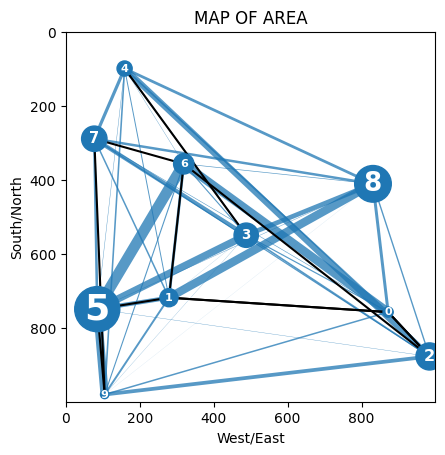

GENERATION #0
Best Score: 2935.903898170367
Track Length: 1571.6092631854817
Average Score: 4017.619985060552
SCORE TO BEAT: 541.580745334333


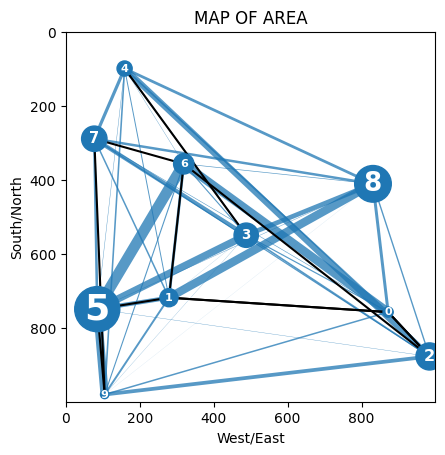

GENERATION #1
Best Score: 2935.903898170367
Track Length: 2243.16676535864
Average Score: 3880.7109347739042
SCORE TO BEAT: 541.580745334333


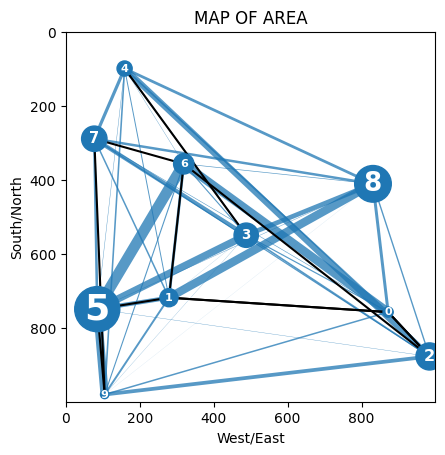

GENERATION #2
Best Score: 2935.903898170367
Track Length: 2455.595333851421
Average Score: 3769.0607130336375
SCORE TO BEAT: 541.580745334333


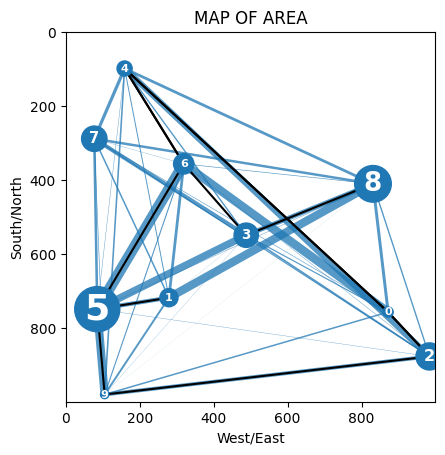

GENERATION #3
Best Score: 2882.4216762788014
Track Length: 2031.408492858408
Average Score: 3685.636643597681
SCORE TO BEAT: 541.580745334333


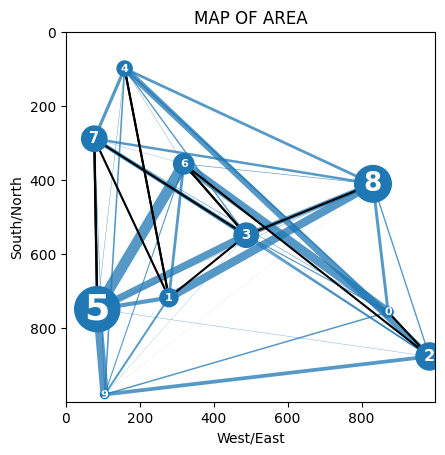

GENERATION #4
Best Score: 2332.29762366155
Track Length: 1775.1913772957732
Average Score: 3544.6955629102276
SCORE TO BEAT: 541.580745334333


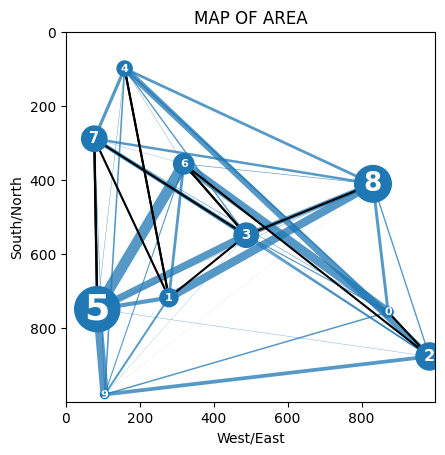

GENERATION #5
Best Score: 2332.29762366155
Track Length: 2164.1013467532757
Average Score: 3494.3245010830783
SCORE TO BEAT: 541.580745334333


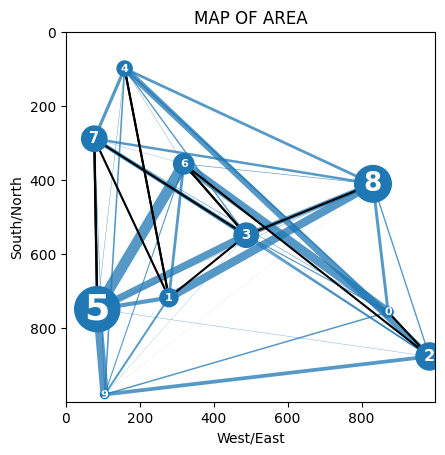

GENERATION #6
Best Score: 2332.29762366155
Track Length: 2164.1013467532757
Average Score: 3435.5013643729153
SCORE TO BEAT: 541.580745334333


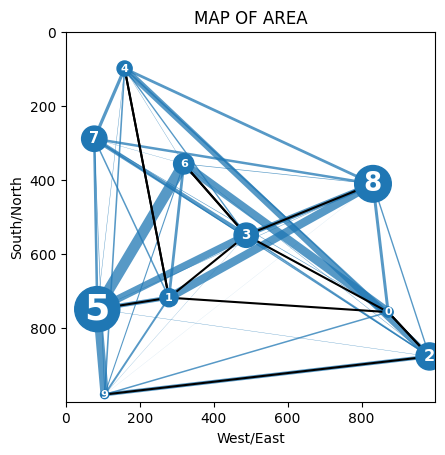

GENERATION #7
Best Score: 2142.457809046461
Track Length: 2443.92869160255
Average Score: 3367.899917599789
SCORE TO BEAT: 541.580745334333


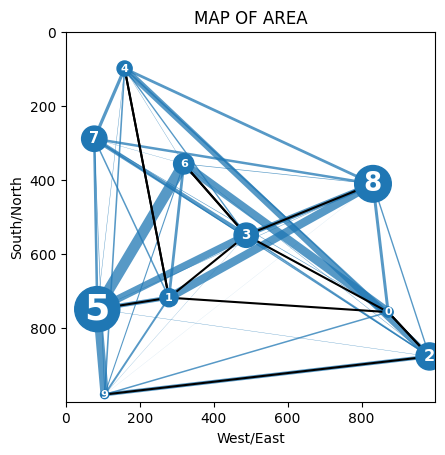

GENERATION #8
Best Score: 2142.457809046461
Track Length: 1413.1597988003584
Average Score: 3311.846245656019
SCORE TO BEAT: 541.580745334333


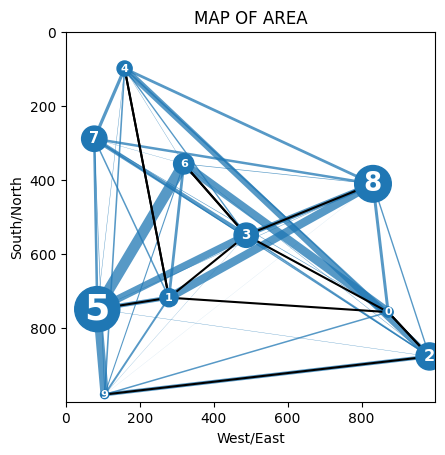

GENERATION #9
Best Score: 2142.457809046461
Track Length: 2443.92869160255
Average Score: 3243.520477832078
SCORE TO BEAT: 541.580745334333


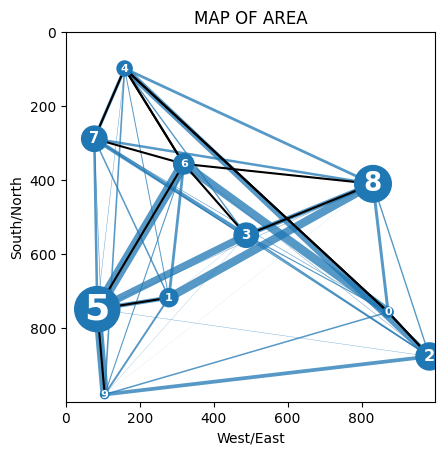

GENERATION #10
Best Score: 2062.0837355732306
Track Length: 2612.1181428526843
Average Score: 3238.3000645534576
SCORE TO BEAT: 541.580745334333


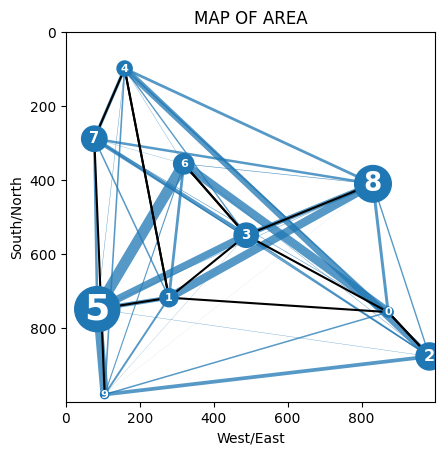

GENERATION #11
Best Score: 1704.9029360234842
Track Length: 2778.8728196958714
Average Score: 3299.0001134780155
SCORE TO BEAT: 541.580745334333


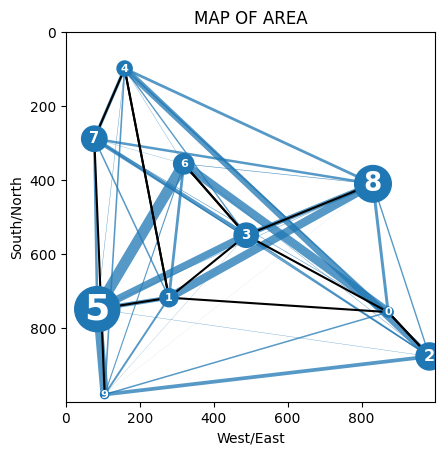

GENERATION #12
Best Score: 1704.9029360234842
Track Length: 2647.2659148335097
Average Score: 3143.4732804152213
SCORE TO BEAT: 541.580745334333


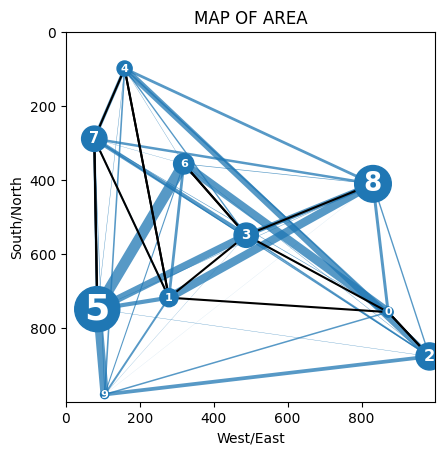

GENERATION #13
Best Score: 1663.3648873605016
Track Length: 2811.3990577152845
Average Score: 3130.6722986719924
SCORE TO BEAT: 541.580745334333


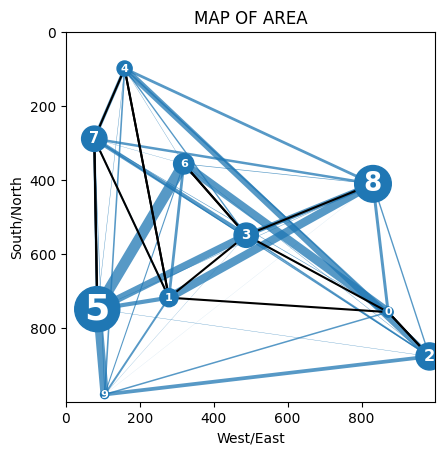

GENERATION #14
Best Score: 1663.3648873605016
Track Length: 2811.3990577152845
Average Score: 3129.5290500154038
SCORE TO BEAT: 541.580745334333


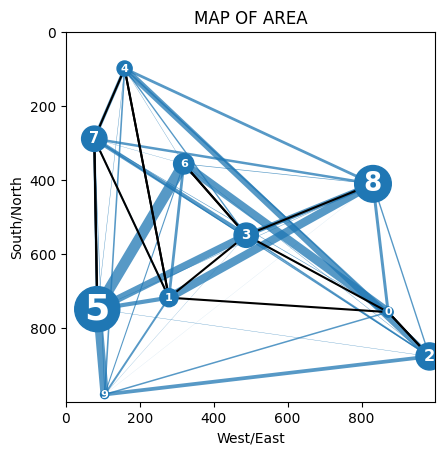

GENERATION #15
Best Score: 1663.3648873605016
Track Length: 2508.752425917606
Average Score: 3041.6014211548654
SCORE TO BEAT: 541.580745334333


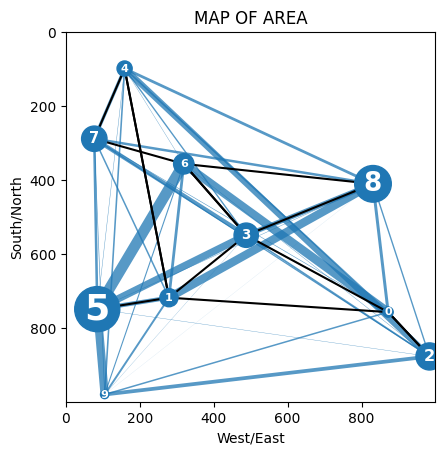

GENERATION #16
Best Score: 1577.8877290225084
Track Length: 2371.829659263013
Average Score: 3026.876007845916
SCORE TO BEAT: 541.580745334333


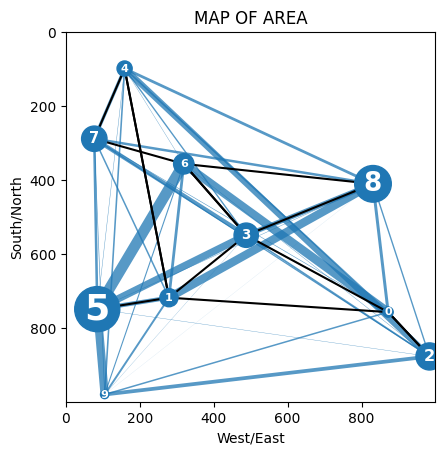

GENERATION #17
Best Score: 1577.8877290225084
Track Length: 1993.1013793927464
Average Score: 2940.8275311789366
SCORE TO BEAT: 541.580745334333


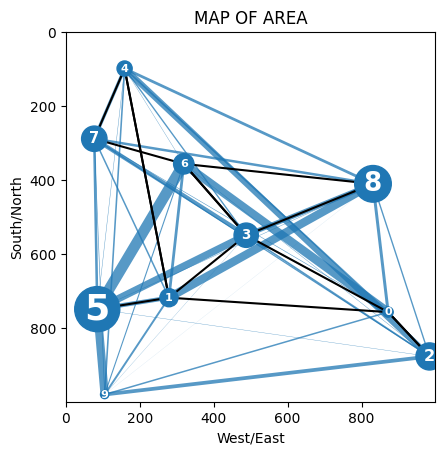

GENERATION #18
Best Score: 1577.8877290225084
Track Length: 1995.8649113362621
Average Score: 2880.526128800094
SCORE TO BEAT: 541.580745334333


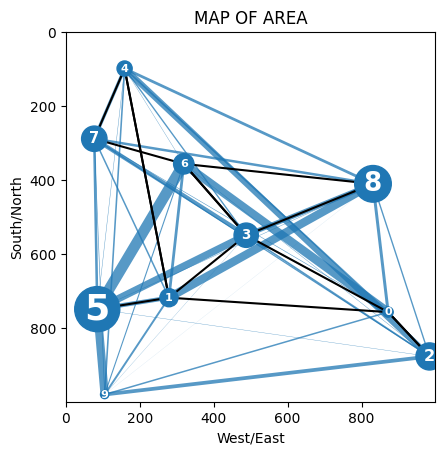

GENERATION #19
Best Score: 1577.8877290225084
Track Length: 1951.9753073178074
Average Score: 2855.0476328651607
SCORE TO BEAT: 541.580745334333


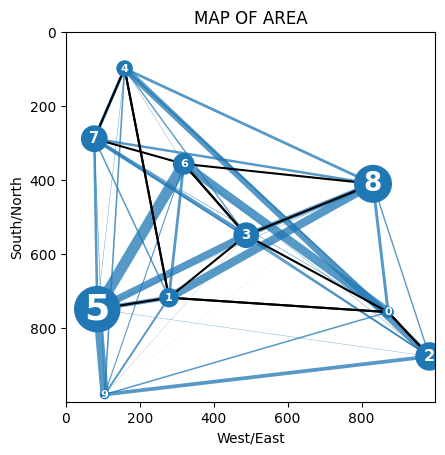

GENERATION #20
Best Score: 1568.1264281914198
Track Length: 2652.2362775931074
Average Score: 2761.0578790514514
SCORE TO BEAT: 541.580745334333


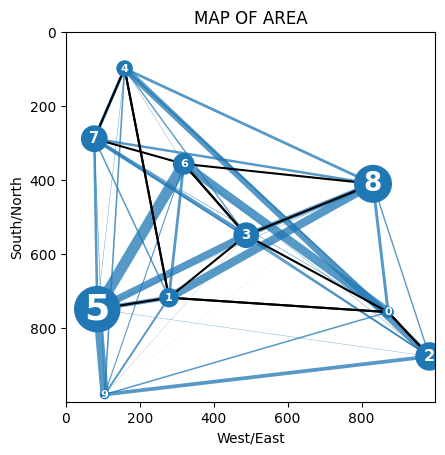

GENERATION #21
Best Score: 1568.1264281914198
Track Length: 2781.5779162804242
Average Score: 2867.4291692448733
SCORE TO BEAT: 541.580745334333


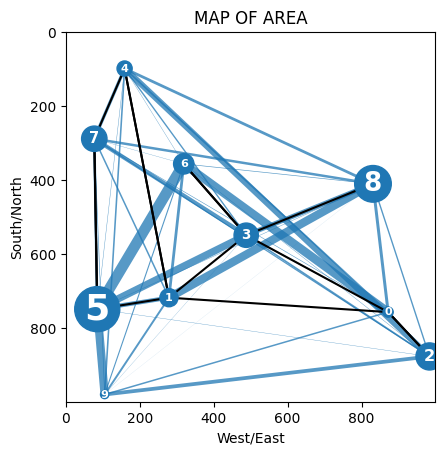

GENERATION #22
Best Score: 1523.571937832385
Track Length: 2474.5846896621456
Average Score: 2857.3683823317474
SCORE TO BEAT: 541.580745334333


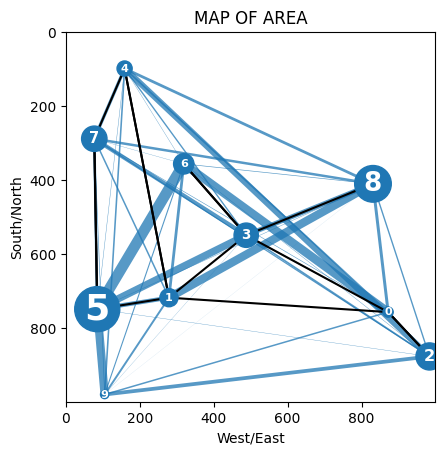

GENERATION #23
Best Score: 1523.571937832385
Track Length: 2860.673124004409
Average Score: 2788.7158816085084
SCORE TO BEAT: 541.580745334333


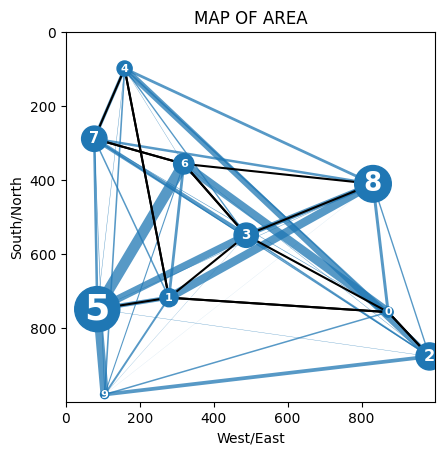

GENERATION #24
Best Score: 1235.755571294585
Track Length: 2675.8508442301368
Average Score: 2669.843001473498
SCORE TO BEAT: 541.580745334333


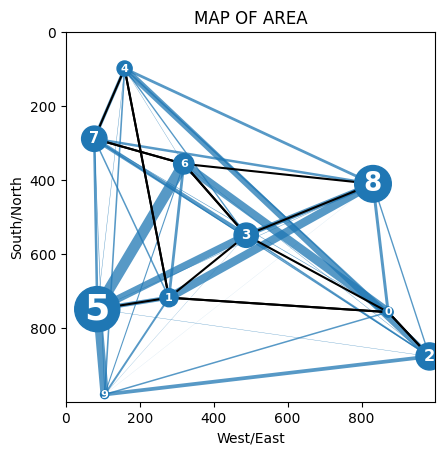

GENERATION #25
Best Score: 1235.755571294585
Track Length: 2537.336917196716
Average Score: 2623.1862777346764
SCORE TO BEAT: 541.580745334333


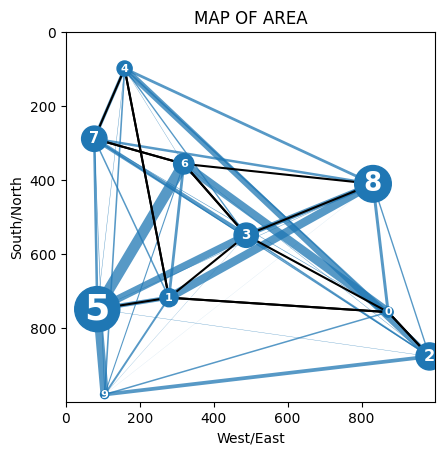

GENERATION #26
Best Score: 1235.755571294585
Track Length: 2537.336917196716
Average Score: 2499.7570088588227
SCORE TO BEAT: 541.580745334333


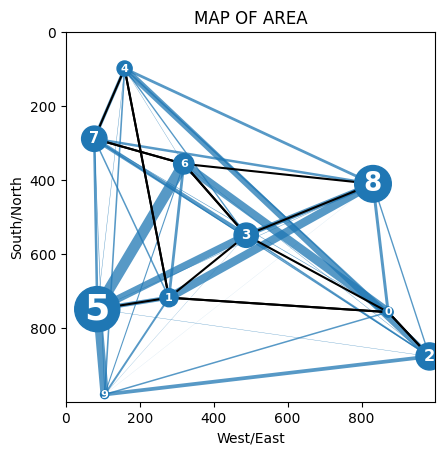

GENERATION #27
Best Score: 1235.755571294585
Track Length: 2537.336917196716
Average Score: 2639.417271327961
SCORE TO BEAT: 541.580745334333


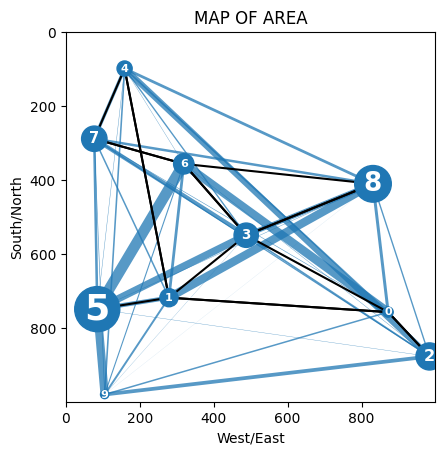

GENERATION #28
Best Score: 1209.8472952367338
Track Length: 2578.953692107044
Average Score: 2598.8264088522396
SCORE TO BEAT: 541.580745334333


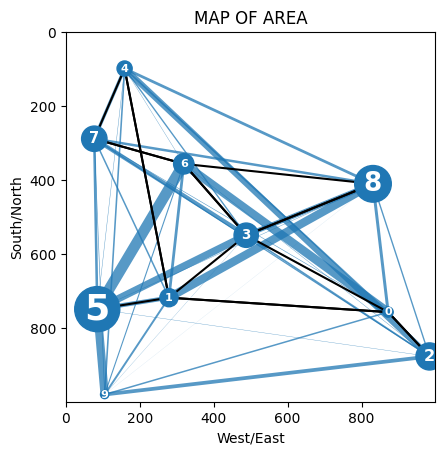

GENERATION #29
Best Score: 1209.8472952367338
Track Length: 2515.930476289337
Average Score: 2632.455296636147
SCORE TO BEAT: 541.580745334333


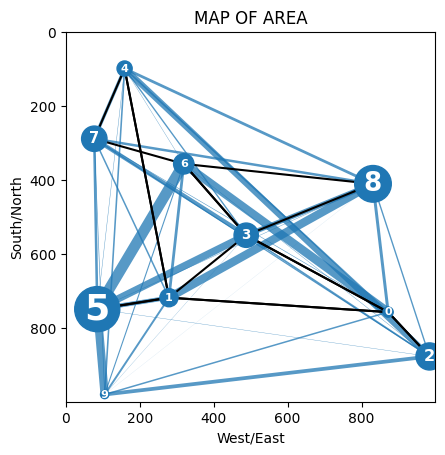

GENERATION #30
Best Score: 1059.1104897512253
Track Length: 2104.7799273823935
Average Score: 2477.6399716665965
SCORE TO BEAT: 541.580745334333


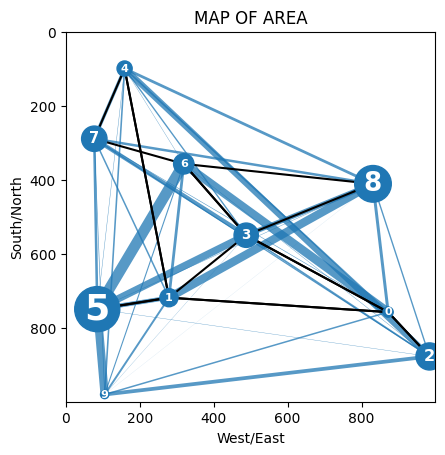

GENERATION #31
Best Score: 1059.1104897512253
Track Length: 2301.24111947895
Average Score: 2446.8550905158463
SCORE TO BEAT: 541.580745334333


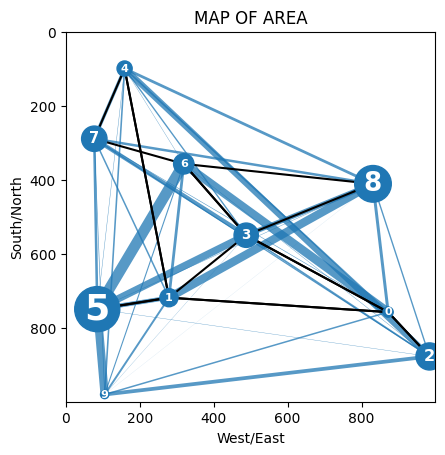

GENERATION #32
Best Score: 1059.1104897512253
Track Length: 2248.3074944131754
Average Score: 2560.2604592128578
SCORE TO BEAT: 541.580745334333


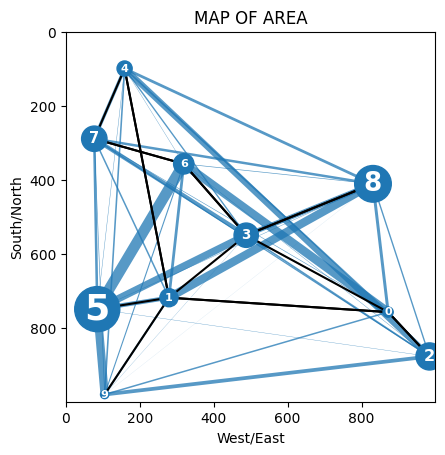

GENERATION #33
Best Score: 1008.1148557040378
Track Length: 2542.5109059897363
Average Score: 2509.261133693056
SCORE TO BEAT: 541.580745334333


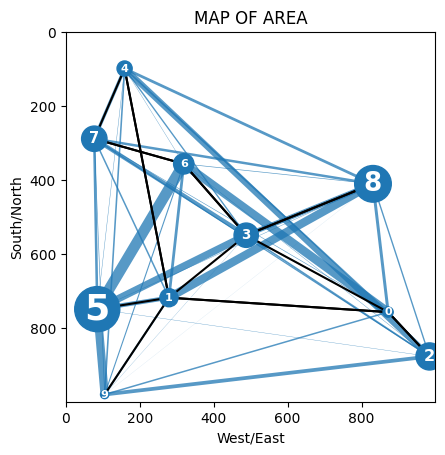

GENERATION #34
Best Score: 1008.1148557040378
Track Length: 2249.5032765844953
Average Score: 2378.1727050862332
SCORE TO BEAT: 541.580745334333


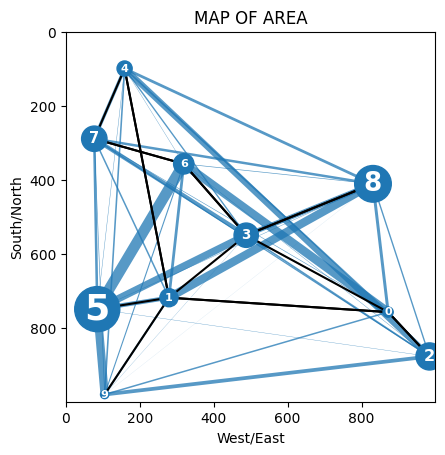

GENERATION #35
Best Score: 1008.1148557040378
Track Length: 2623.527805846001
Average Score: 2220.5222906706144
SCORE TO BEAT: 541.580745334333


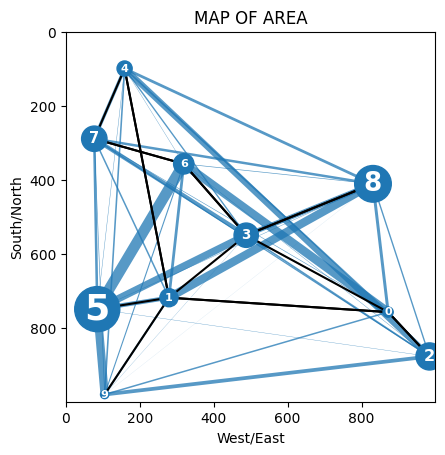

GENERATION #36
Best Score: 1008.1148557040378
Track Length: 2734.9555177375996
Average Score: 2346.2965717006773
SCORE TO BEAT: 541.580745334333


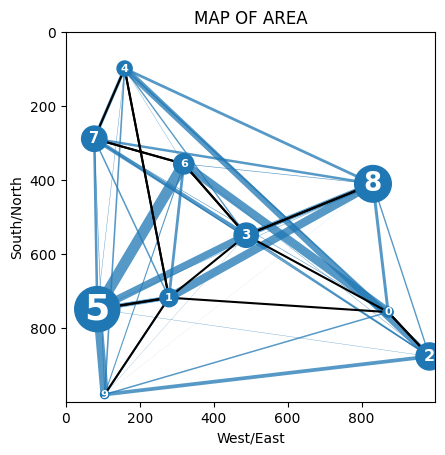

GENERATION #37
Best Score: 872.7147811215674
Track Length: 2820.0721060828528
Average Score: 2256.012677263138
SCORE TO BEAT: 541.580745334333


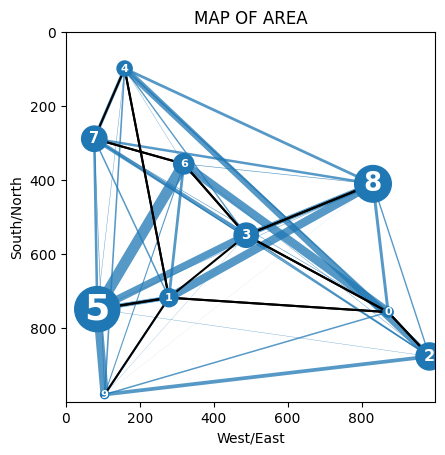

GENERATION #38
Best Score: 840.6553090505661
Track Length: 1878.0058971082917
Average Score: 2220.8466160604785
SCORE TO BEAT: 541.580745334333


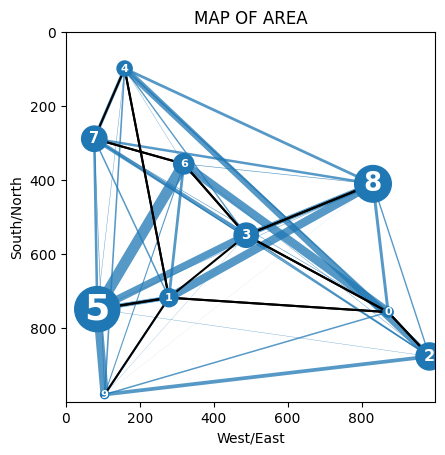

GENERATION #39
Best Score: 840.6553090505661
Track Length: 1878.0058971082917
Average Score: 2209.2109957739963
SCORE TO BEAT: 541.580745334333


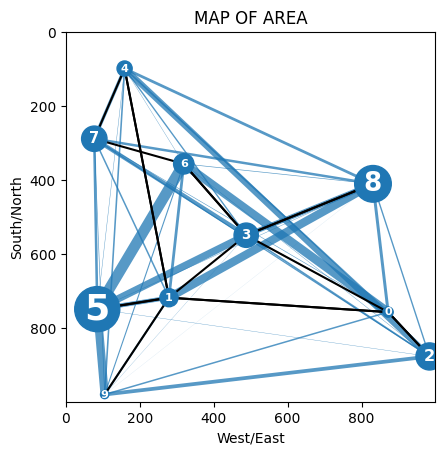

GENERATION #40
Best Score: 831.4935228595111
Track Length: 1878.0058971082917
Average Score: 2312.3164378467495
SCORE TO BEAT: 541.580745334333


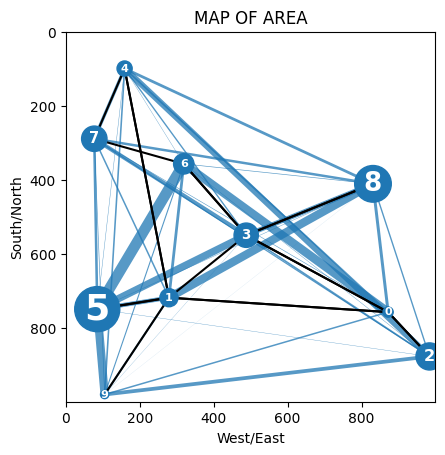

GENERATION #41
Best Score: 807.5397691833533
Track Length: 1893.1179269235056
Average Score: 2247.558729532996
SCORE TO BEAT: 541.580745334333


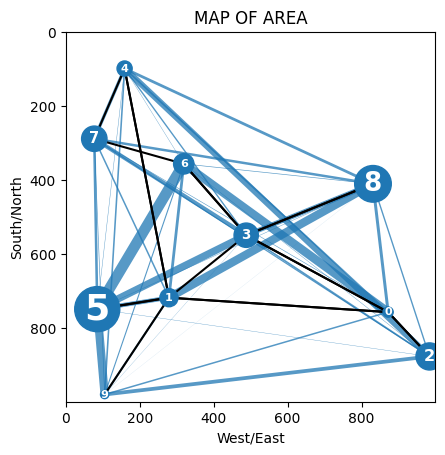

GENERATION #42
Best Score: 807.5397691833533
Track Length: 1893.1179269235056
Average Score: 2223.8838973883758
SCORE TO BEAT: 541.580745334333


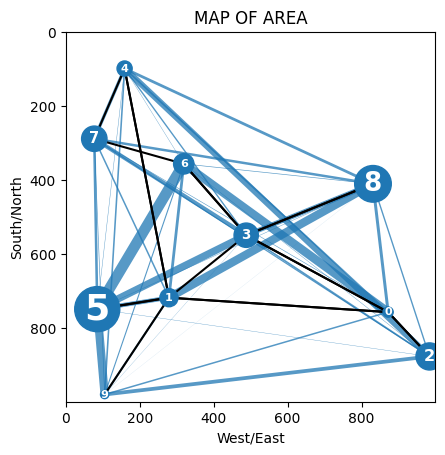

GENERATION #43
Best Score: 807.5397691833533
Track Length: 1893.1179269235056
Average Score: 2315.475701262333
SCORE TO BEAT: 541.580745334333


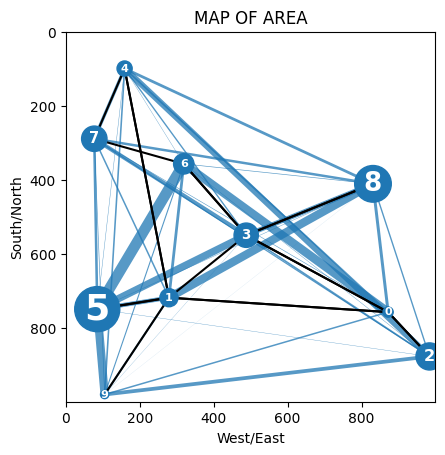

GENERATION #44
Best Score: 807.5397691833533
Track Length: 2668.8105983335918
Average Score: 2154.7989633389784
SCORE TO BEAT: 541.580745334333


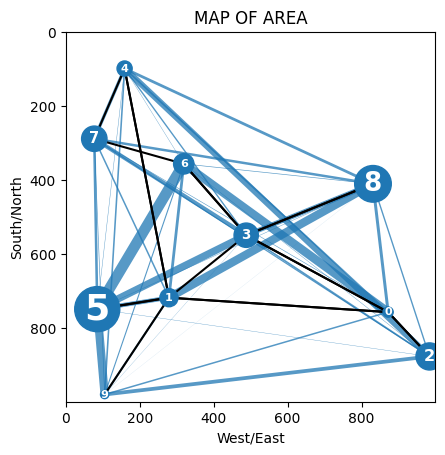

GENERATION #45
Best Score: 807.5397691833533
Track Length: 2782.7576546517103
Average Score: 2164.8093545516103
SCORE TO BEAT: 541.580745334333


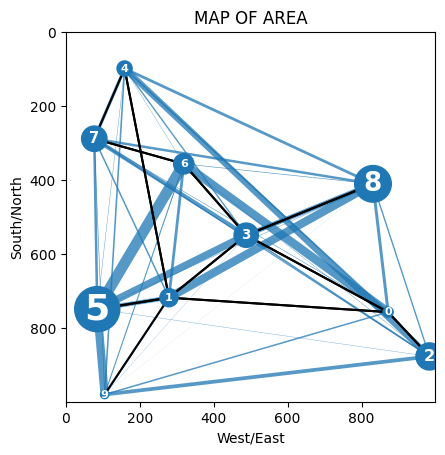

GENERATION #46
Best Score: 718.4193192103385
Track Length: 2199.9642588736674
Average Score: 2213.406935232109
SCORE TO BEAT: 541.580745334333


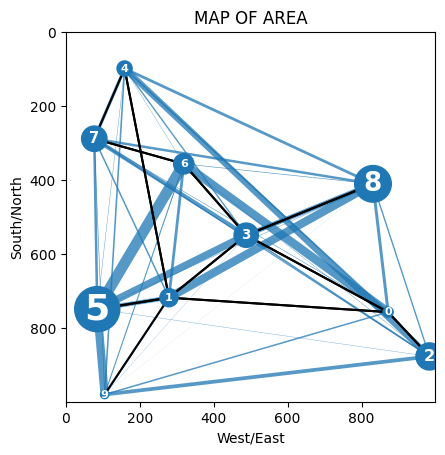

GENERATION #47
Best Score: 718.4193192103385
Track Length: 2199.9642588736674
Average Score: 2104.118460533
SCORE TO BEAT: 541.580745334333


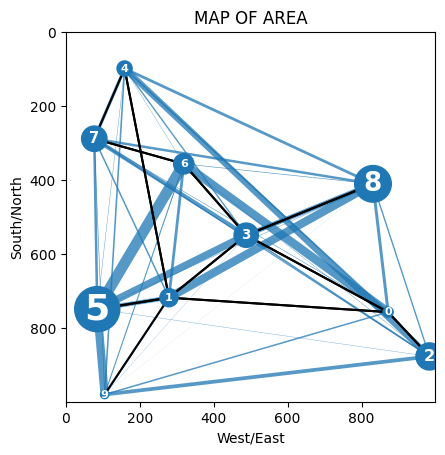

GENERATION #48
Best Score: 718.4193192103385
Track Length: 2199.9642588736674
Average Score: 2094.8100047124994
SCORE TO BEAT: 541.580745334333


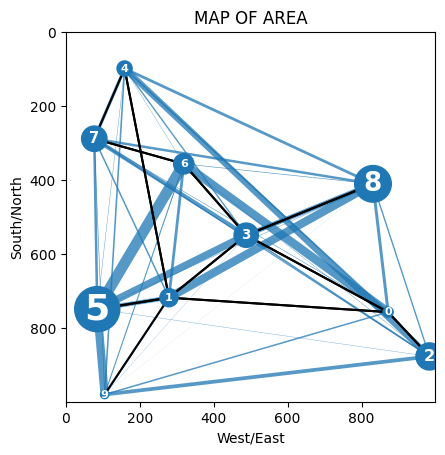

GENERATION #49
Best Score: 718.4193192103385
Track Length: 2199.9642588736674
Average Score: 2065.139554861916
SCORE TO BEAT: 541.580745334333


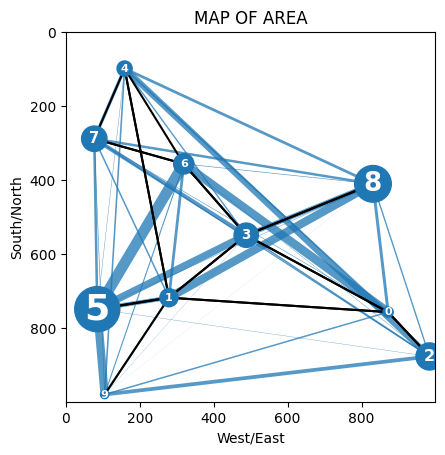

GENERATION #50
Best Score: 685.8482205387359
Track Length: 2782.5483531482487
Average Score: 2045.2085135221494
SCORE TO BEAT: 541.580745334333


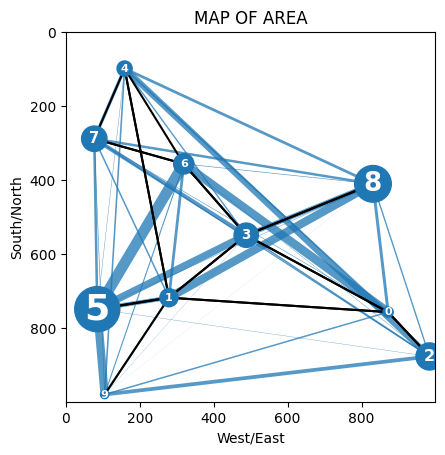

GENERATION #51
Best Score: 685.8482205387359
Track Length: 2928.8936788047376
Average Score: 2022.7311523097299
SCORE TO BEAT: 541.580745334333


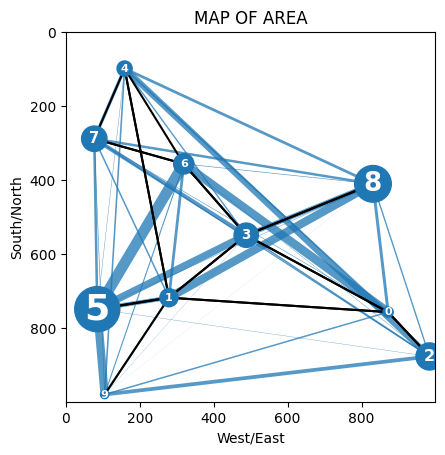

GENERATION #52
Best Score: 685.8482205387359
Track Length: 2668.001946329271
Average Score: 2079.067024804745
SCORE TO BEAT: 541.580745334333


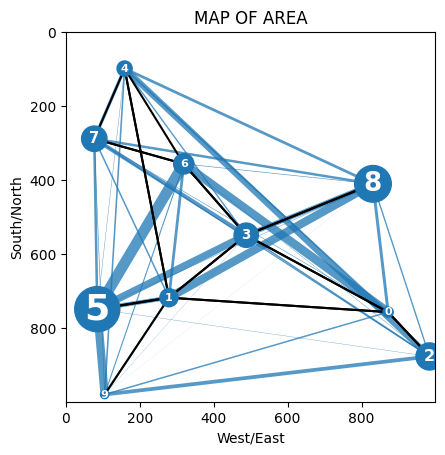

GENERATION #53
Best Score: 685.8482205387359
Track Length: 2668.001946329271
Average Score: 1929.7873183188326
SCORE TO BEAT: 541.580745334333


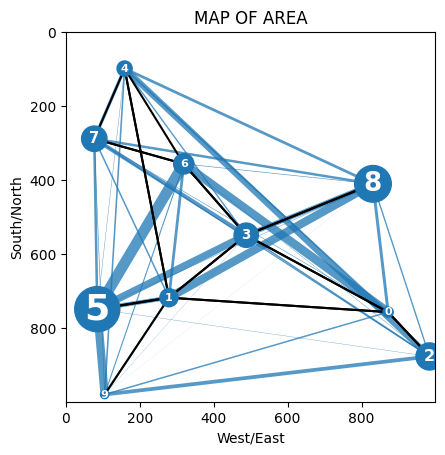

GENERATION #54
Best Score: 685.8482205387359
Track Length: 2214.973839174005
Average Score: 1896.5567374014347
SCORE TO BEAT: 541.580745334333


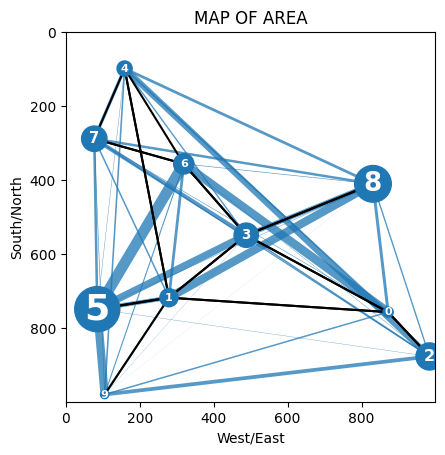

GENERATION #55
Best Score: 685.8482205387359
Track Length: 2214.973839174005
Average Score: 2018.5025902330585
SCORE TO BEAT: 541.580745334333


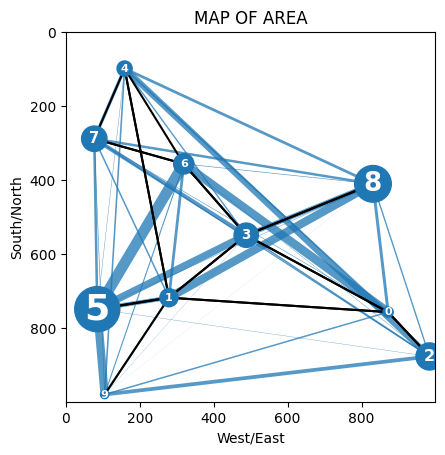

GENERATION #56
Best Score: 685.8482205387359
Track Length: 2214.973839174005
Average Score: 1999.2934777947253
SCORE TO BEAT: 541.580745334333


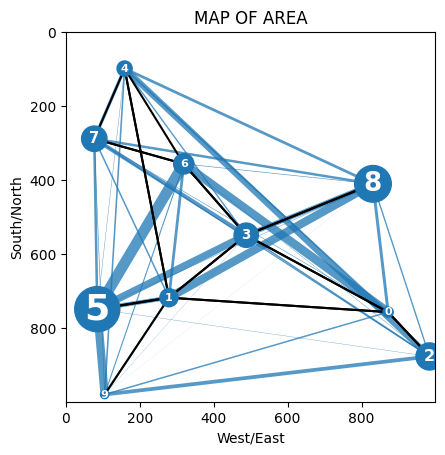

GENERATION #57
Best Score: 685.8482205387359
Track Length: 2214.973839174005
Average Score: 2024.002884881753
SCORE TO BEAT: 541.580745334333


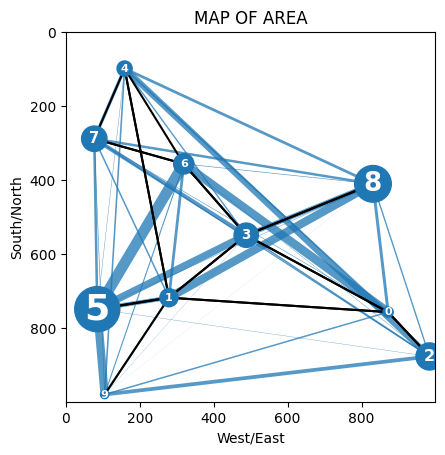

GENERATION #58
Best Score: 685.8482205387359
Track Length: 2631.8239420689156
Average Score: 2043.158695114007
SCORE TO BEAT: 541.580745334333


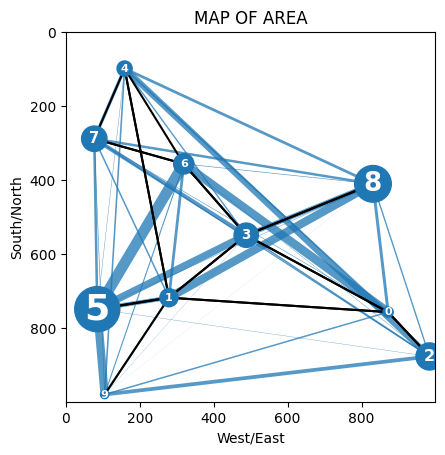

GENERATION #59
Best Score: 685.8482205387359
Track Length: 2787.2892796718456
Average Score: 2091.117656958013
SCORE TO BEAT: 541.580745334333


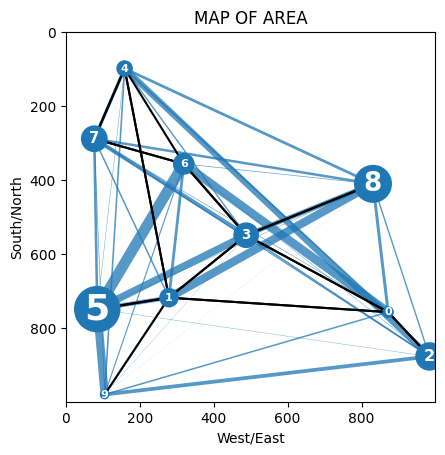

GENERATION #60
Best Score: 684.0879397192008
Track Length: 2843.1658842918805
Average Score: 2136.4970034865746
SCORE TO BEAT: 541.580745334333


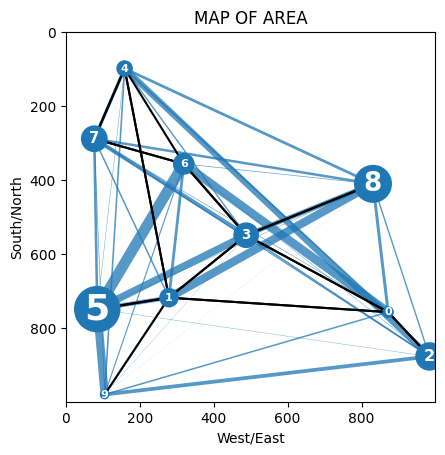

GENERATION #61
Best Score: 684.0879397192008
Track Length: 2922.944139342341
Average Score: 2020.508459962779
SCORE TO BEAT: 541.580745334333


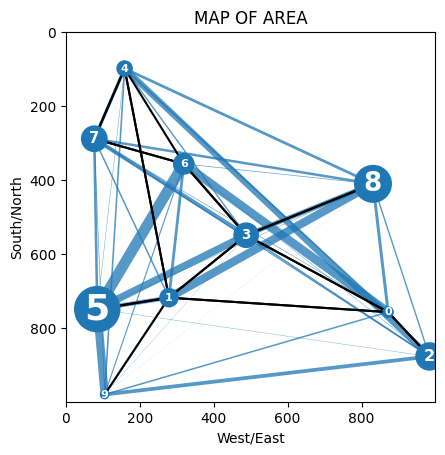

GENERATION #62
Best Score: 684.0879397192008
Track Length: 3137.0067388753237
Average Score: 1966.2900761938922
SCORE TO BEAT: 541.580745334333


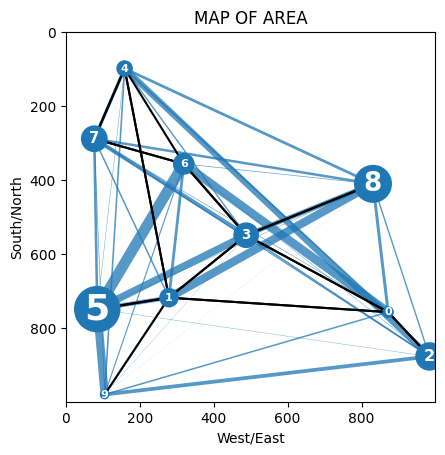

GENERATION #63
Best Score: 684.0879397192008
Track Length: 2556.7373069779896
Average Score: 1854.0083387372492
SCORE TO BEAT: 541.580745334333


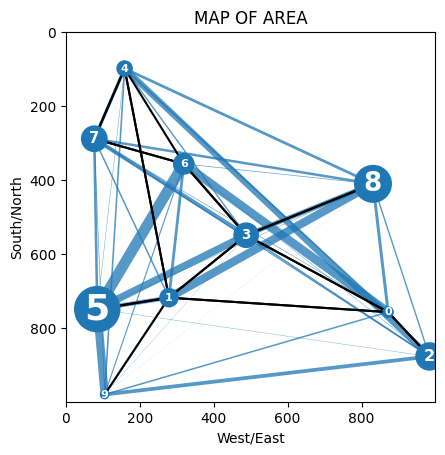

GENERATION #64
Best Score: 684.0879397192008
Track Length: 2556.7373069779896
Average Score: 1940.7096610707476
SCORE TO BEAT: 541.580745334333


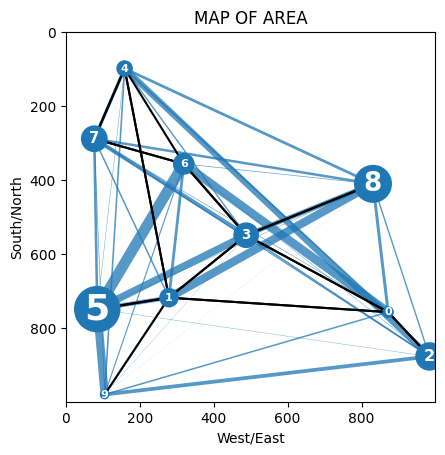

GENERATION #65
Best Score: 684.0879397192008
Track Length: 3024.872522713
Average Score: 1811.7530975895068
SCORE TO BEAT: 541.580745334333


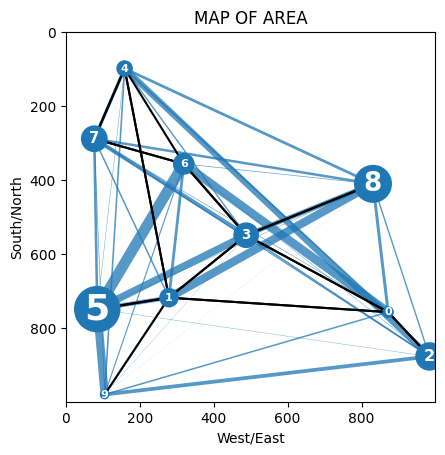

GENERATION #66
Best Score: 684.0879397192008
Track Length: 2572.4638081270364
Average Score: 1861.343806714273
SCORE TO BEAT: 541.580745334333


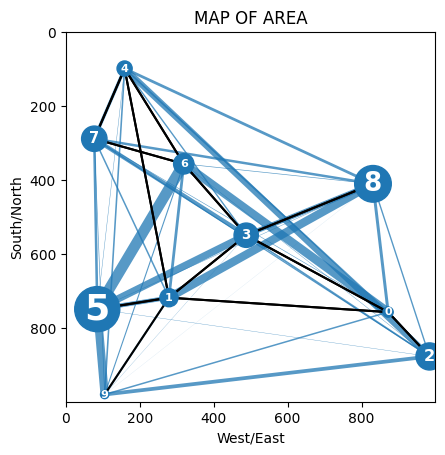

GENERATION #67
Best Score: 680.2669616149738
Track Length: 2572.4638081270364
Average Score: 1938.5363161307876
SCORE TO BEAT: 541.580745334333


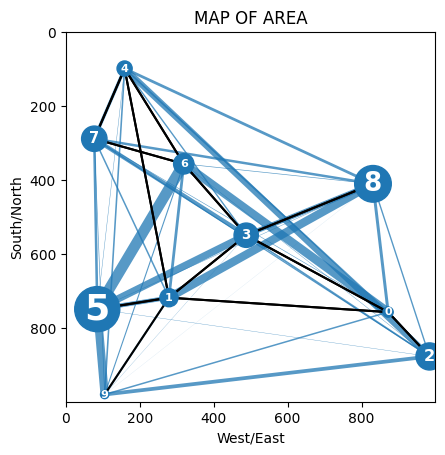

GENERATION #68
Best Score: 680.2669616149738
Track Length: 3374.811348561127
Average Score: 1714.1509861502325
SCORE TO BEAT: 541.580745334333


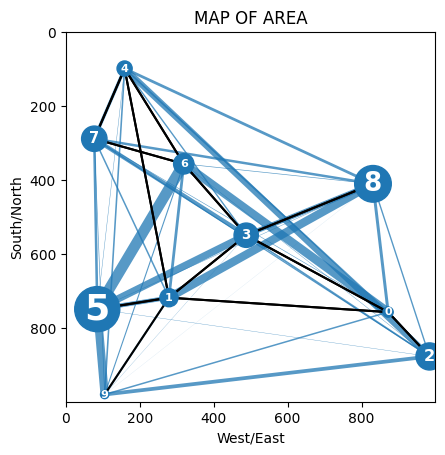

GENERATION #69
Best Score: 680.2669616149738
Track Length: 3247.148309349867
Average Score: 1840.8739173585172
SCORE TO BEAT: 541.580745334333


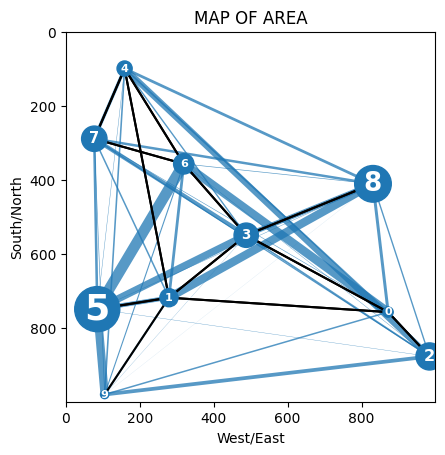

GENERATION #70
Best Score: 680.2669616149738
Track Length: 2764.4738841765898
Average Score: 1923.7216314461514
SCORE TO BEAT: 541.580745334333


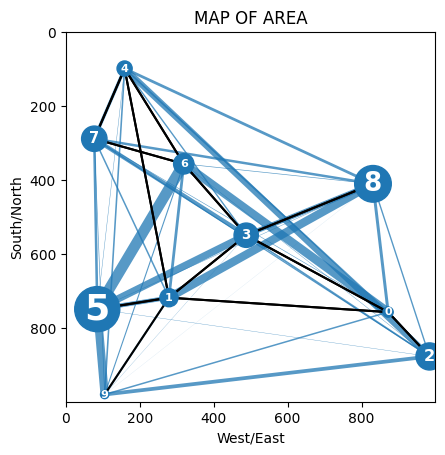

GENERATION #71
Best Score: 680.2669616149738
Track Length: 3169.6613102687306
Average Score: 1949.0698565557814
SCORE TO BEAT: 541.580745334333


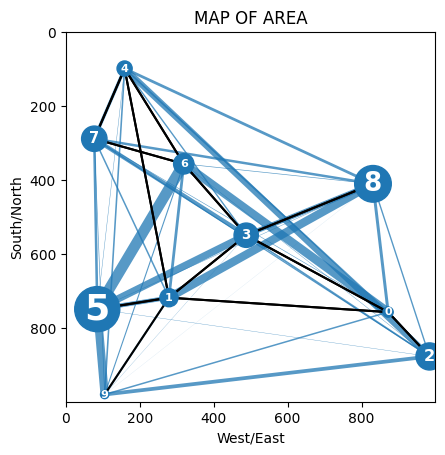

GENERATION #72
Best Score: 680.2669616149738
Track Length: 2659.287977069441
Average Score: 2011.961821269752
SCORE TO BEAT: 541.580745334333


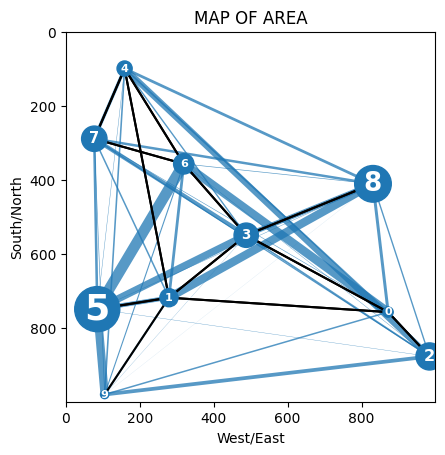

GENERATION #73
Best Score: 680.2669616149738
Track Length: 2541.2767315698584
Average Score: 1998.4815064251213
SCORE TO BEAT: 541.580745334333


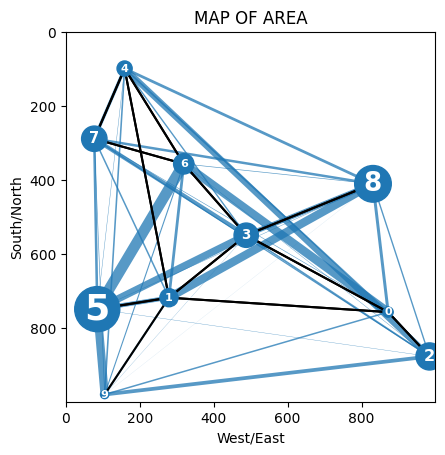

GENERATION #74
Best Score: 680.2669616149738
Track Length: 2541.2767315698584
Average Score: 1919.4510717708542
SCORE TO BEAT: 541.580745334333


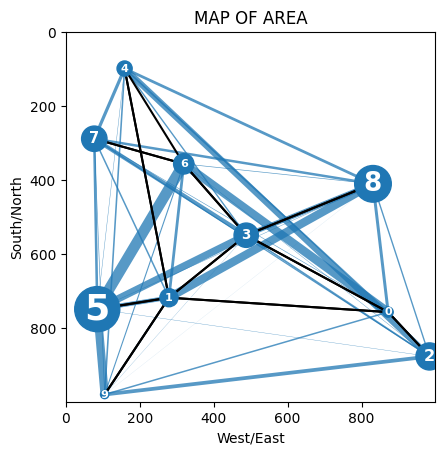

GENERATION #75
Best Score: 656.4311943643187
Track Length: 2738.7315913681587
Average Score: 1830.9755575642234
SCORE TO BEAT: 541.580745334333


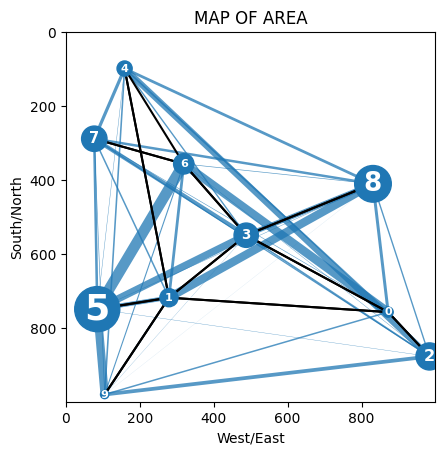

GENERATION #76
Best Score: 656.4311943643187
Track Length: 3087.5215495966486
Average Score: 1892.229416864866
SCORE TO BEAT: 541.580745334333


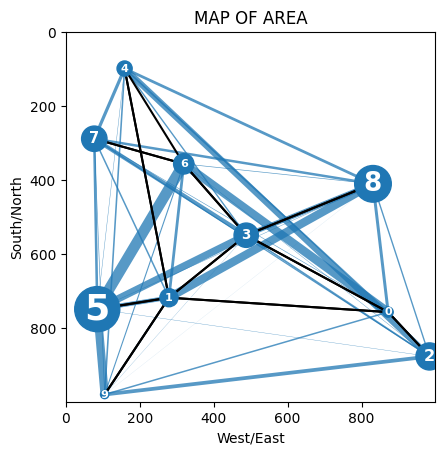

GENERATION #77
Best Score: 656.4311943643187
Track Length: 2479.1438228662105
Average Score: 1839.317820635934
SCORE TO BEAT: 541.580745334333


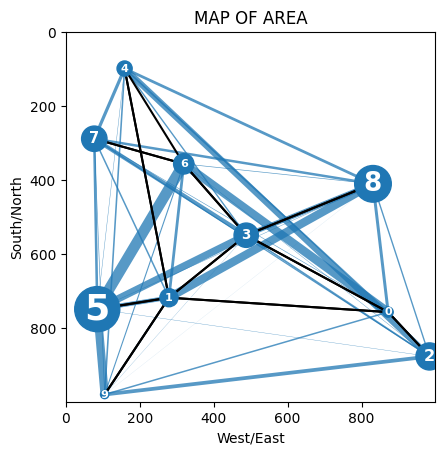

GENERATION #78
Best Score: 656.4311943643187
Track Length: 2042.6454829558177
Average Score: 1933.6802986503667
SCORE TO BEAT: 541.580745334333


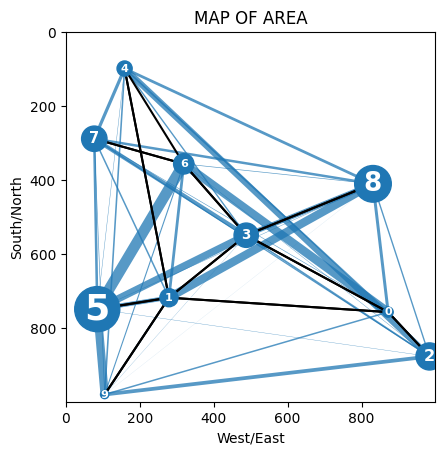

GENERATION #79
Best Score: 656.4311943643187
Track Length: 2306.8002204192635
Average Score: 1915.4288564236444
SCORE TO BEAT: 541.580745334333


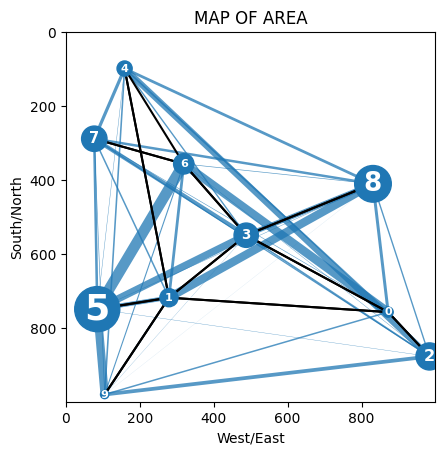

GENERATION #80
Best Score: 656.4311943643187
Track Length: 2911.7826530189514
Average Score: 1848.6140647868765
SCORE TO BEAT: 541.580745334333


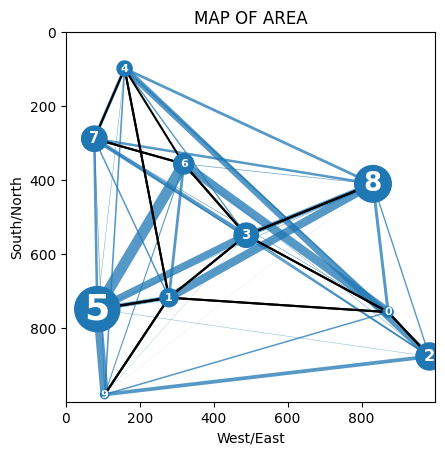

GENERATION #81
Best Score: 645.4320940362015
Track Length: 2712.4022585590606
Average Score: 1865.656189191039
SCORE TO BEAT: 541.580745334333


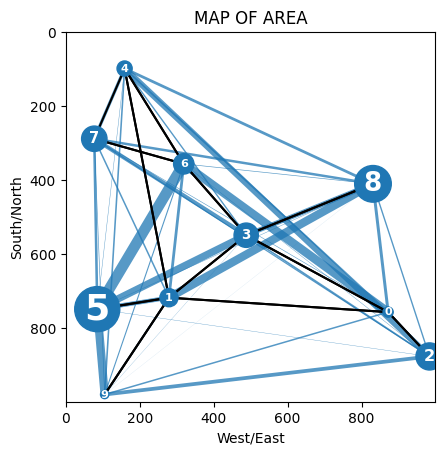

GENERATION #82
Best Score: 641.6111159319744
Track Length: 2159.5010103684717
Average Score: 1892.8903788319037
SCORE TO BEAT: 541.580745334333


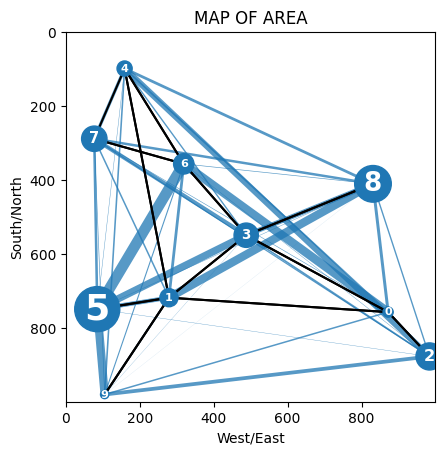

GENERATION #83
Best Score: 641.6111159319744
Track Length: 2159.5010103684717
Average Score: 1691.0443336907424
SCORE TO BEAT: 541.580745334333


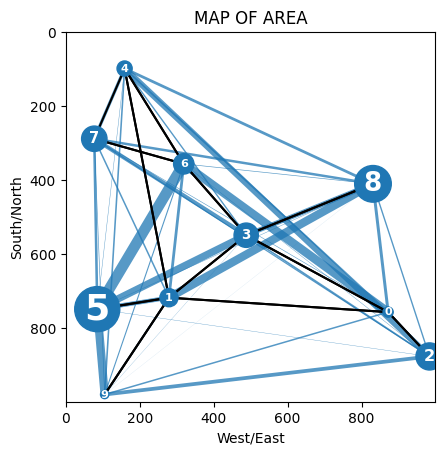

GENERATION #84
Best Score: 641.6111159319744
Track Length: 2113.4386974450417
Average Score: 1860.3678982697288
SCORE TO BEAT: 541.580745334333


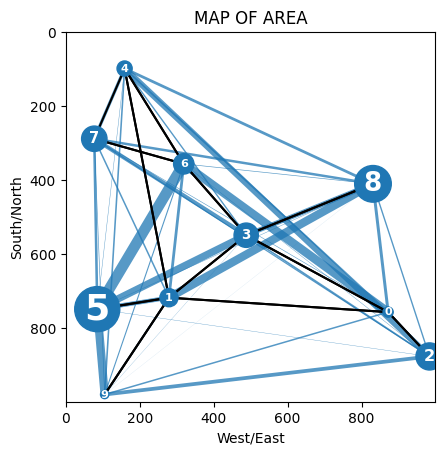

GENERATION #85
Best Score: 641.6111159319744
Track Length: 2113.4386974450417
Average Score: 1889.891514276115
SCORE TO BEAT: 541.580745334333


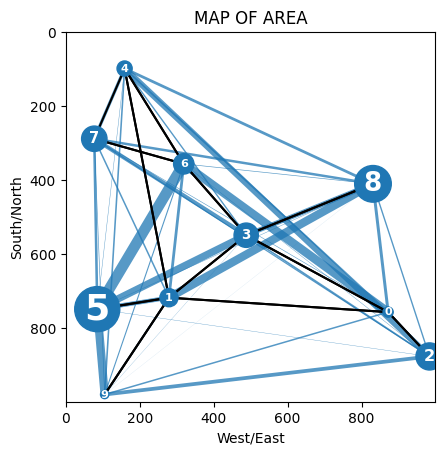

GENERATION #86
Best Score: 641.6111159319744
Track Length: 1993.381860676636
Average Score: 1976.129168978208
SCORE TO BEAT: 541.580745334333


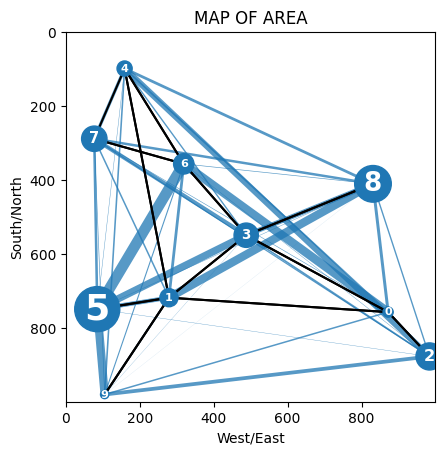

GENERATION #87
Best Score: 641.6111159319744
Track Length: 2703.4691310348207
Average Score: 2151.1353533259257
SCORE TO BEAT: 541.580745334333


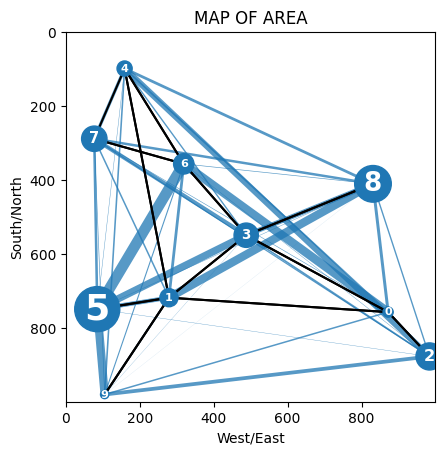

GENERATION #88
Best Score: 641.6111159319744
Track Length: 2173.7632496896285
Average Score: 2034.6259356847127
SCORE TO BEAT: 541.580745334333


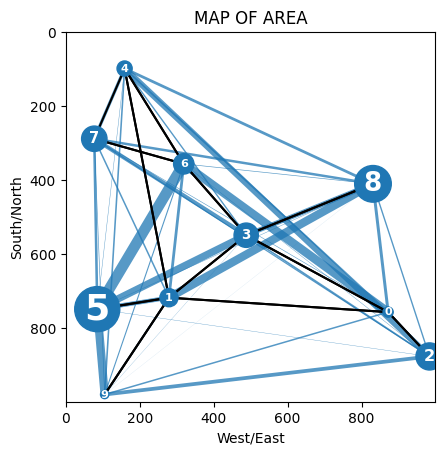

GENERATION #89
Best Score: 641.6111159319744
Track Length: 2380.7028544055943
Average Score: 2007.9916483702214
SCORE TO BEAT: 541.580745334333


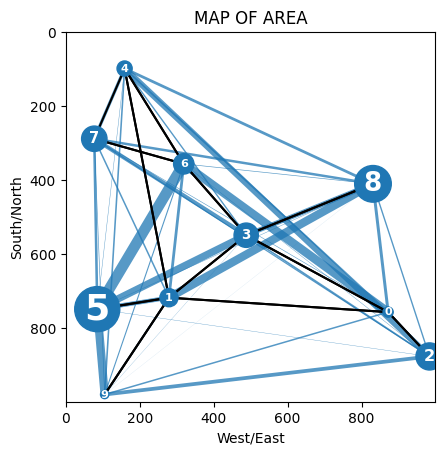

GENERATION #90
Best Score: 641.6111159319744
Track Length: 2050.085425071516
Average Score: 2030.005044863203
SCORE TO BEAT: 541.580745334333


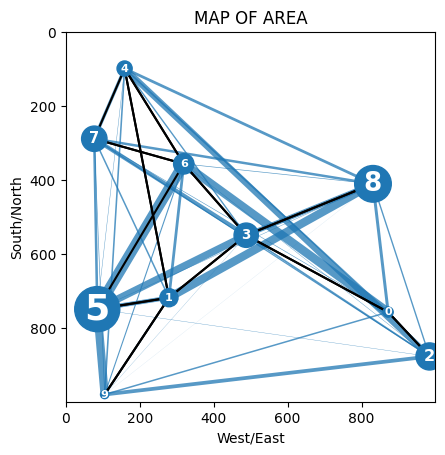

GENERATION #91
Best Score: 632.9840607659036
Track Length: 1791.2242484252129
Average Score: 2025.4910305705218
SCORE TO BEAT: 541.580745334333


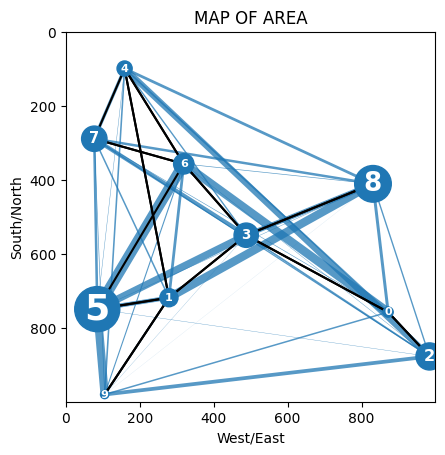

GENERATION #92
Best Score: 632.9840607659036
Track Length: 2385.866998317953
Average Score: 2097.1707216907103
SCORE TO BEAT: 541.580745334333


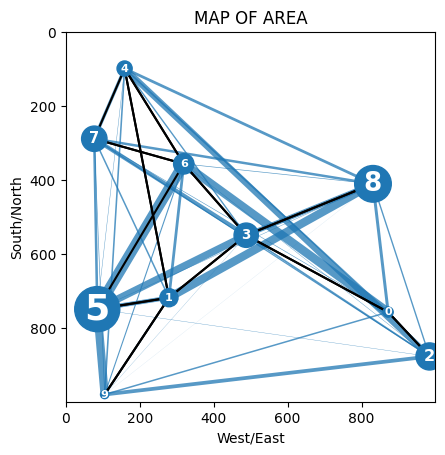

GENERATION #93
Best Score: 632.9840607659036
Track Length: 2672.3649173217127
Average Score: 2255.1254087404577
SCORE TO BEAT: 541.580745334333


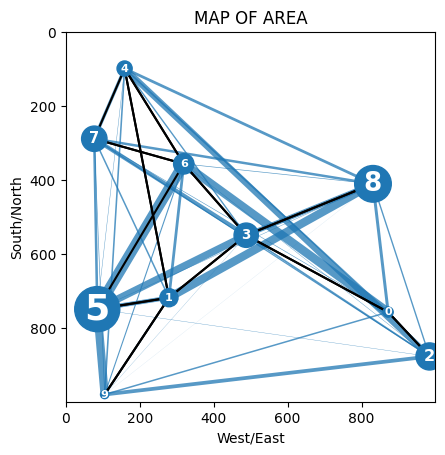

GENERATION #94
Best Score: 632.9840607659036
Track Length: 2740.755488333133
Average Score: 2157.5855698808773
SCORE TO BEAT: 541.580745334333


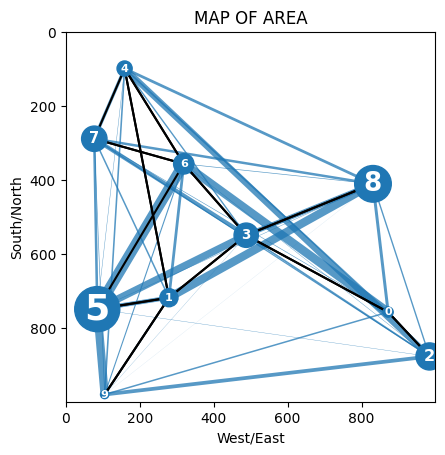

GENERATION #95
Best Score: 632.9840607659036
Track Length: 2073.5512670057383
Average Score: 2166.126451099135
SCORE TO BEAT: 541.580745334333


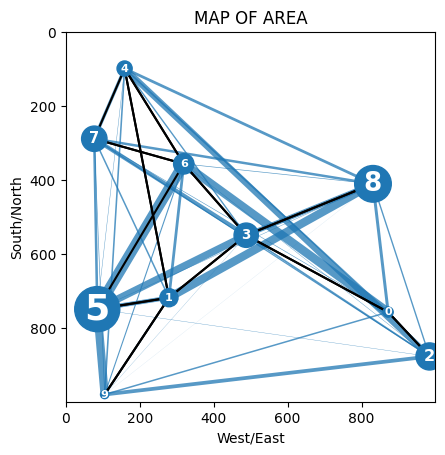

GENERATION #96
Best Score: 632.9840607659036
Track Length: 2618.4557671755947
Average Score: 2188.511083267571
SCORE TO BEAT: 541.580745334333


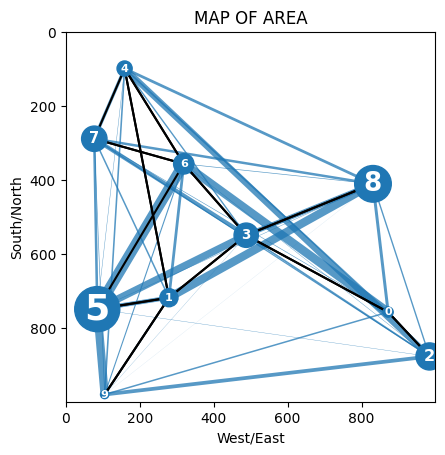

GENERATION #97
Best Score: 632.9840607659036
Track Length: 3083.7040286617685
Average Score: 2133.509104192098
SCORE TO BEAT: 541.580745334333


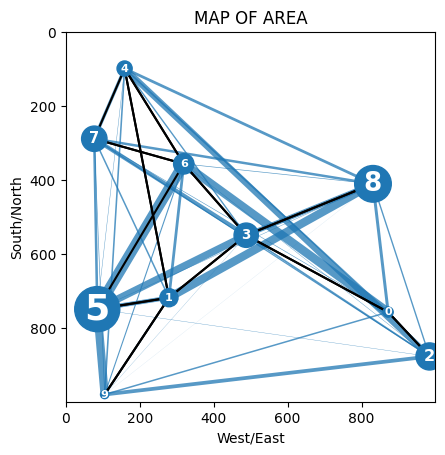

GENERATION #98
Best Score: 632.9840607659036
Track Length: 3082.447658117482
Average Score: 1960.7371352949965
SCORE TO BEAT: 541.580745334333


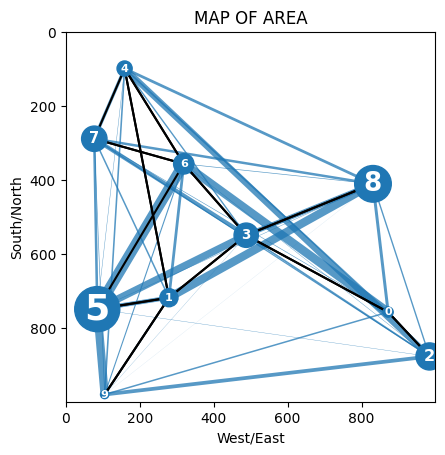

GENERATION #99
Best Score: 632.9840607659036
Track Length: 2321.7332207728064
Average Score: 2116.9351673332167
SCORE TO BEAT: 541.580745334333


In [ ]:
for gen in range(NUM_GENERATIONS):
  # Evaluate population
  best_idx, best_gen_score, best_track_len, best_line, avg_score, LINES_SCORES = evaluate(LINES_POP)

  # Display results
  plot_system(CANVAS, best_line)
  print(f'\033[1mGENERATION #{gen}\033[0m')
  print(f'Best Score: {best_gen_score}')
  print(f'Track Length: {best_track_len}')
  print(f'Average Score: {avg_score}')
  print(f'SCORE TO BEAT: {BEST_SCORE}')

  # Selection (parents and elites)
  parent_idxs, mutated_idxs, elite_idxs = selection(LINES_SCORES)
  parents = LINES_POP[parent_idxs]
  mutants = LINES_POP[mutated_idxs]
  elites = LINES_POP[elite_idxs]

  # Crossover
  children = crossover(parents)

  # Mutation
  mutated = mutation(mutants)

  # Next gen
  del LINES_POP
  LINES_POP = np.concatenate((children, mutants), axis=0)
  LINES_POP = np.concatenate((LINES_POP, elites), axis=0)

# **4. Results**